## Overview

## Packages & Data Loading

In [188]:
## Import Packages

from datetime import datetime
import matplotlib.pyplot as plt
from datetime import datetime
from matplotlib import pyplot as plt
plt.style.use('ggplot')
from math import log, exp
import numpy as np
import pandas as pd
import plotly as ptly
import plotly.figure_factory as ff
import plotly.graph_objs as go
import plotly.plotly as py
import re
import seaborn as sns
from scipy import stats
from sklearn import linear_model
%matplotlib inline
pd.set_option('display.max_columns', None) # show all columns
pd.set_option('display.max_rows', None) # show all rows
#sns.set()


In [189]:
## Load Data

train_df = pd.read_csv('./all/Train.csv')
test_df = pd.read_csv('./all/Test.csv')

train_df.sample(5)
#test_df.sample(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
373,374,20,RL,79.0,10634,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,1953,1953,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,PConc,TA,TA,No,BLQ,428,LwQ,180,0,608,GasA,TA,Y,SBrkr,1319,0,0,1319,1,0,1,0,3,1,TA,5,Min2,0,NaN,Attchd,1953.0,Unf,1,270,TA,TA,Y,66,0,0,0,0,0,NaN,GdWo,NaN,0,11,2009,WD,Normal,123000
680,681,120,RL,50.0,8012,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,TwnhsE,1Story,6,5,1980,1980,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,BLQ,543,BLQ,119,261,923,GasA,TA,Y,SBrkr,923,0,0,923,0,0,2,0,2,1,TA,5,Typ,1,TA,Attchd,1980.0,RFn,1,264,TA,TA,Y,80,0,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal,143000
753,754,60,RL,80.0,10240,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,BrkFace,178.0,Gd,TA,PConc,Gd,TA,Mn,Unf,0,Unf,0,1030,1030,GasA,Gd,Y,SBrkr,1038,1060,0,2098,0,0,2,1,3,1,Ex,8,Typ,1,Gd,Attchd,2005.0,RFn,3,878,TA,TA,Y,192,52,0,0,0,0,NaN,NaN,NaN,0,3,2006,WD,Normal,275500
77,78,50,RM,50.0,8635,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1.5Fin,5,5,1948,2001,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,BLQ,336,GLQ,41,295,672,GasA,TA,Y,SBrkr,1072,213,0,1285,1,0,1,0,2,1,TA,6,Min1,0,NaN,Detchd,1948.0,Unf,1,240,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,NaN,0,1,2008,WD,Normal,127000
455,456,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,7,6,1973,1973,Hip,CompShg,HdBoard,HdBoard,BrkFace,320.0,TA,TA,CBlock,TA,TA,No,ALQ,916,Unf,0,326,1242,GasA,Fa,Y,SBrkr,1242,0,0,1242,0,0,1,1,3,1,TA,6,Typ,1,TA,Attchd,1973.0,Unf,2,528,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,9,2007,WD,Normal,175500


In [190]:
# Save the 'Id' column
train_ID = train_df['Id']
test_ID = test_df['Id']

# Now drop the 'Id' column since we can not use it as a feature to train our model.
train_df.drop("Id", axis = 1, inplace = True)
test_df.drop("Id", axis = 1, inplace = True)

In [191]:
y_train = train_df['SalePrice']
X_train = train_df.drop('SalePrice', axis=1)
X_test = test_df.copy()

In [192]:
#del train_df, test_df # saving memory

In [193]:
## Shape of each data set

print('Train: ' + str(train_df.shape) + ";  Test: " + str(test_df.shape))

# Output: ~1460 rows and ~80 columns in each dataset


Train: (1460, 80);  Test: (1459, 79)


In [194]:
## Combine X train and test

all_data = pd.concat([X_train, X_test], ignore_index=True)
all_data.shape


(2919, 79)

## Inspect Data & Visualize

In [196]:
## See if contains any duplicated rows

all_data[all_data.duplicated(keep=False)].sort_values(by='LotArea') # keep=False marks all duplicates as True

# Output: there are two duplicated records; left them for now


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
193,160,RM,24.0,2522,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Twnhs,2Story,7,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,Stone,50.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,970.0,970.0,GasA,Ex,Y,SBrkr,970,739,0,1709,0.0,0.0,2,0,3,1,Gd,7,Maj1,0,NaN,Detchd,2004.0,Unf,2.0,380.0,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
2865,160,RM,24.0,2522,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Twnhs,2Story,7,5,2004,2004,Gable,CompShg,VinylSd,VinylSd,Stone,50.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,970.0,970.0,GasA,Ex,Y,SBrkr,970,739,0,1709,0.0,0.0,2,0,3,1,Gd,7,Maj1,0,NaN,Detchd,2004.0,Unf,2.0,380.0,TA,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal
829,160,FV,24.0,2544,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,Twnhs,2Story,7,5,2005,2005,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,600.0,600.0,GasA,Ex,Y,SBrkr,520,623,80,1223,0.0,0.0,2,1,2,1,Gd,4,Typ,0,NaN,Detchd,2005.0,RFn,2.0,480.0,TA,TA,Y,0,166,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal
2713,160,FV,24.0,2544,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,Twnhs,2Story,7,5,2005,2005,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,600.0,600.0,GasA,Ex,Y,SBrkr,520,623,80,1223,0.0,0.0,2,1,2,1,Gd,4,Typ,0,NaN,Detchd,2005.0,RFn,2.0,480.0,TA,TA,Y,0,166,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal


In [159]:
## Datatype of each feature, by dataset

train_col = train_df.dtypes.reset_index().rename(columns={"index": "col_name", 0: "dtype"})
test_col = test_df.dtypes.reset_index().rename(columns={"index": "col_name", 0: "dtype"})

## Merge two datasets' columns and types together

pd.merge(train_col, test_col, how='outer', on='col_name', suffixes=('_train', '_test'))

# Output: same cols in both sets
# and some columns in test set are float while others in train are int # group (minor)


,col_name,dtype_train,dtype_test
0,MSSubClass,int64,int64
1,MSZoning,object,object
2,LotFrontage,float64,float64
3,LotArea,int64,int64
4,Street,object,object
5,Alley,object,object
6,LotShape,object,object
7,LandContour,object,object
8,Utilities,object,object
9,LotConfig,object,object


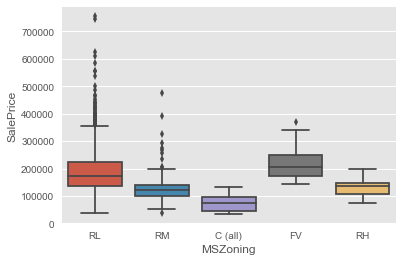

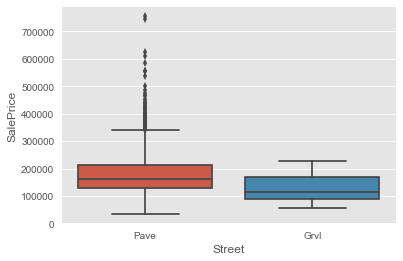

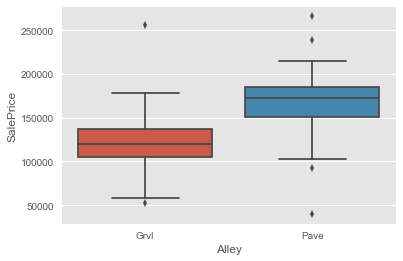

In [160]:
## Visualize categorical features with boxplot against SalePrice

#cols = ['Neighborhood', 'LotShape']
cols = list(train_df.select_dtypes(["object"]).columns)
for i, col in enumerate(train_df[cols[:3]]): # when all of these cols used, killed the kernel
    plt.figure(i)
    sns.boxplot(x=train_df[col], y="SalePrice", data=train_df)


In [161]:
## Describe all numerical features (count, mean, min, max, etc.)

round(train_df.describe())


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.0,1201.0,1460.0,1460.0,1460.0,1460.0,1460.0,1452.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1379.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0,1460.0
mean,57.0,70.0,10517.0,6.0,6.0,1971.0,1985.0,104.0,444.0,47.0,567.0,1057.0,1163.0,347.0,6.0,1515.0,0.0,0.0,2.0,0.0,3.0,1.0,7.0,1.0,1979.0,2.0,473.0,94.0,47.0,22.0,3.0,15.0,3.0,43.0,6.0,2008.0,180921.0
std,42.0,24.0,9981.0,1.0,1.0,30.0,21.0,181.0,456.0,161.0,442.0,439.0,387.0,437.0,49.0,525.0,1.0,0.0,1.0,1.0,1.0,0.0,2.0,1.0,25.0,1.0,214.0,125.0,66.0,61.0,29.0,56.0,40.0,496.0,3.0,1.0,79443.0
min,20.0,21.0,1300.0,1.0,1.0,1872.0,1950.0,0.0,0.0,0.0,0.0,0.0,334.0,0.0,0.0,334.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,1900.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0,34900.0
25%,20.0,59.0,7554.0,5.0,5.0,1954.0,1967.0,0.0,0.0,0.0,223.0,796.0,882.0,0.0,0.0,1130.0,0.0,0.0,1.0,0.0,2.0,1.0,5.0,0.0,1961.0,1.0,334.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2007.0,129975.0
50%,50.0,69.0,9478.0,6.0,5.0,1973.0,1994.0,0.0,384.0,0.0,478.0,992.0,1087.0,0.0,0.0,1464.0,0.0,0.0,2.0,0.0,3.0,1.0,6.0,1.0,1980.0,2.0,480.0,0.0,25.0,0.0,0.0,0.0,0.0,0.0,6.0,2008.0,163000.0
75%,70.0,80.0,11602.0,7.0,6.0,2000.0,2004.0,166.0,712.0,0.0,808.0,1298.0,1391.0,728.0,0.0,1777.0,1.0,0.0,2.0,1.0,3.0,1.0,7.0,1.0,2002.0,2.0,576.0,168.0,68.0,0.0,0.0,0.0,0.0,0.0,8.0,2009.0,214000.0
max,190.0,313.0,215245.0,10.0,9.0,2010.0,2010.0,1600.0,5644.0,1474.0,2336.0,6110.0,4692.0,2065.0,572.0,5642.0,3.0,2.0,3.0,2.0,8.0,3.0,14.0,3.0,2010.0,4.0,1418.0,857.0,547.0,552.0,508.0,480.0,738.0,15500.0,12.0,2010.0,755000.0


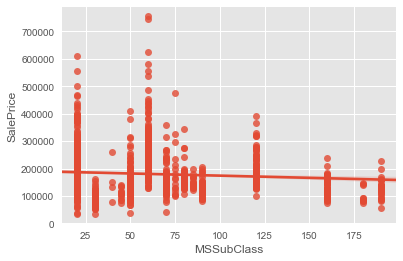

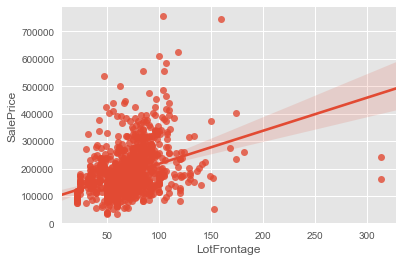

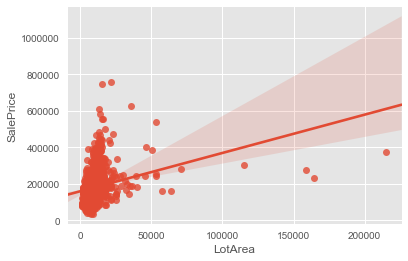

In [162]:
## Visualize numeric features with scatterplot

cols = list(train_df.select_dtypes(['float64', 'int64']).columns)
# or specify column: cols = ['colname']
for i, col in enumerate(train_df[cols[:3]]): # when all of these cols used, killed the kernel
    plt.figure(i)
    sns.regplot(x=train_df[col], y="SalePrice", data=train_df)

# Decent linear relationship: SF and Area features and Rooms (TotalBsmtSF, 1stFlrSF, LotArea ish, GrLivArea, 2ndFlrSF if have 2nd floor, Garage Area, TotRmsAbvGnd)


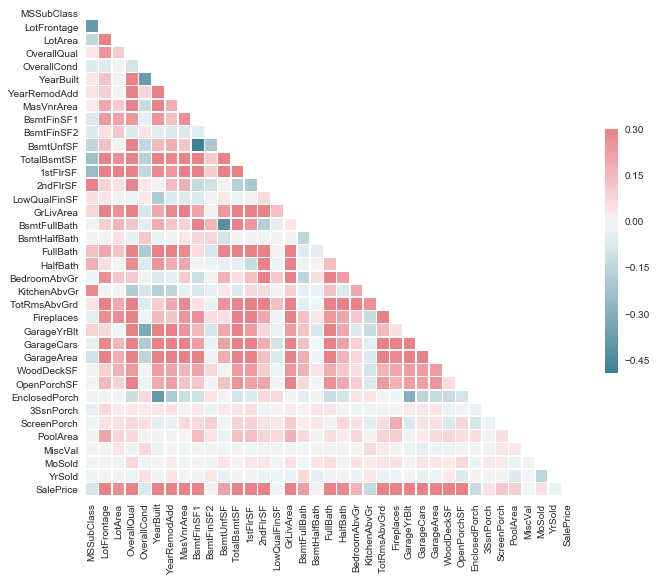

In [163]:
## Correlation Plot

from string import ascii_letters
sns.set(style="white")

# Compute the correlation matrix
#corr = train_df.drop(['Id'], axis=1).corr()
corr = train_df.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Ref: https://seaborn.pydata.org/examples/many_pairwise_correlations.html


/Users/ctapen/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



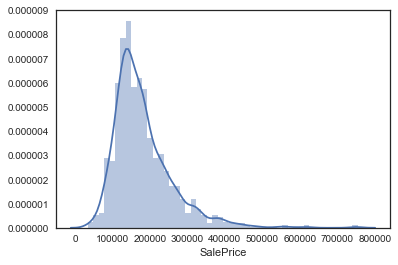

In [164]:
## Visualize the Response Variable (SalePrice) Histogram

sns.distplot(y_train, bins=50)
# question: how get normal corve show up as well?


/Users/ctapen/anaconda3/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning:

The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.



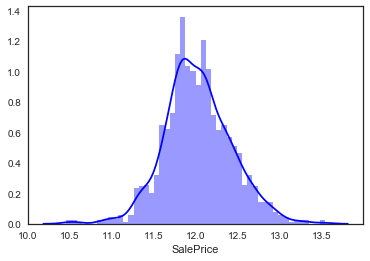

In [165]:
## Scaling Response

y_train_scaled = np.log(y_train)
sns.distplot(y_train_scaled, bins=50, color='blue')

# question: undo this?


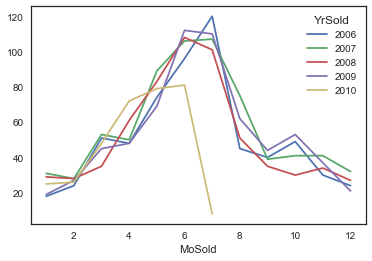

In [166]:
## Seasonality- Volume
all_data.groupby(['MoSold','YrSold']).count()['Street'].unstack().plot()

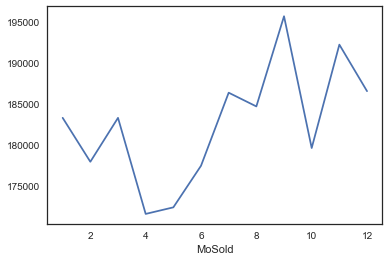

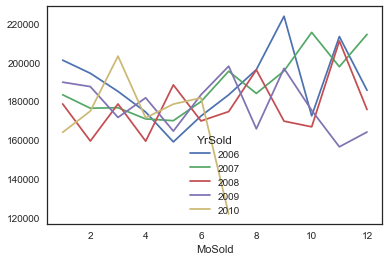

In [167]:
## Seasonality- Price

# In agg- Train data
train_df.groupby(['MoSold']).mean()['SalePrice'].plot()
# add thickness by volume per year?

# By Year- Train data
train_df.groupby(['MoSold','YrSold']).mean()['SalePrice'].unstack().plot()


In [168]:
## SalePrice Mean and Count by YearMo

round(train_df.groupby(['MoSold','YrSold']).agg(['mean','count'])['SalePrice'].unstack())


mean                                         count              \
YrSold      2006      2007      2008      2009      2010  2006  2007  2008   
MoSold                                                                       
1       201090.0  183235.0  178505.0  189736.0  163853.0  10.0  13.0  13.0   
2       194322.0  176302.0  159370.0  187450.0  174823.0   9.0   8.0  10.0   
3       184982.0  176568.0  178505.0  171547.0  203181.0  25.0  23.0  18.0   
4       174313.0  170773.0  159293.0  181681.0  171344.0  27.0  23.0  26.0   
5       158928.0  169874.0  188334.0  164483.0  178422.0  38.0  43.0  38.0   
6       172283.0  179726.0  169731.0  183261.0  181640.0  48.0  59.0  51.0   
7       183211.0  195397.0  174563.0  197984.0  121750.0  67.0  51.0  49.0   
8       196240.0  183941.0  196077.0  165671.0       NaN  23.0  40.0  29.0   
9       223769.0  195534.0  169626.0  196849.0       NaN  15.0  11.0  17.0   
10      172357.0  215429.0  166691.0  175207.0       NaN  24.0  16.0  22.0   
11      213285.0  197709.0  210981.0  156382.0       NaN  16.0  24.0  17.0   
12      185545.0  214414.0  175600.0  164015.0       NaN  12.0  18.0  14.0   

                    
YrSold  2009  2010  
MoSold              
1       12.0  10.0  
2       10.0  15.0  
3       19.0  21.0  
4       26.0  39.0  
5       37.0  48.0  
6       59.0  36.0  
7       61.0   6.0  
8       30.0   NaN  
9       20.0   NaN  
10      27.0   NaN  
11      22.0   NaN  
12      15.0   NaN

In [ ]:
## Additional Vizs

# Add: remodeled yrs ago vs. price and remodeled X yrs ago/not, # bedrooms, grlivarea, correlation bars against SalePrice only


## Missingness

In [169]:
## Look at number missing values per column

pd.DataFrame(train_df.isnull().sum().sort_values(ascending=False)).reset_index()\
    .rename(columns={"index": "col_name", 0: "missing_cnt"})


,col_name,missing_cnt
0,PoolQC,1453
1,MiscFeature,1406
2,Alley,1369
3,Fence,1179
4,FireplaceQu,690
5,LotFrontage,259
6,GarageType,81
7,GarageCond,81
8,GarageFinish,81
9,GarageQual,81


In [180]:
## Fill in missing values

# Idea borrowed from this script: https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard
#def impute(all_data):

# Fill a bunch with None (description says NA means none)
values = {# Misc Features
    'PoolQC': 'None', 'MiscFeature': 'None', 'Alley': 'None', 'Fence': 'None', 'FireplaceQu': 'None', 
          # Garage Features
          'GarageCond': 'None', 'GarageType': 'None', 'GarageYrBlt': 'None', 'GarageFinish': 'None', 'GarageQual': 'None',
          # Basement
          'BsmtExposure': 'None', 'BsmtFinType2': 'None', 'BsmtFinType1': 'None', 'BsmtCond': 'None', 'BsmtQual': 'None'
         }
all_data = all_data.fillna(value=values)

# Electrical : It has one NA value. Since this feature has mostly 'SBrkr', we can set that for the missing value.
all_data['Electrical'] = all_data['Electrical'].fillna(all_data['Electrical'].mode()[0]) # used mode of train_df to prev leakage

# LotFrontage : Since the area of each street connected to the house property most likely have a similar area to other houses in its neighborhood , we can fill in missing values by the median LotFrontage of the neighborhood.
# Group by neighborhood and fill in missing value by the median LotFrontage of all the neighborhood
all_data["LotFrontage"] = all_data.groupby("Neighborhood")["LotFrontage"].transform(lambda x: x.fillna(x.median()))
# or I was going to use LotAreaToFrontage Ratio: 
#all_data['LotAreaToFrontage'] = all_data['LotArea']/all_data['LotFrontage']
#LotFrontage_Impute = train.groupby('LotConfig')['LotAreaToFrontage'].agg(['mean','count']).reset_index()

# GarageYrBlt, GarageArea and GarageCars : Replacing missing data with 0 (Since No garage = no cars in such garage.)
for col in ('GarageYrBlt', 'GarageArea', 'GarageCars'):
    all_data[col] = all_data[col].fillna(0)

# BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, BsmtFullBath and BsmtHalfBath : missing values are likely zero for having no basement
for col in ('BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF','TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath'):
    all_data[col] = all_data[col].fillna(0)

# MasVnrArea and MasVnrType : NA most likely means no masonry veneer for these houses. We can fill 0 for the area and None for the type.
all_data["MasVnrType"] = all_data["MasVnrType"].fillna("None")
all_data["MasVnrArea"] = all_data["MasVnrArea"].fillna(0)

# MSZoning (The general zoning classification) : 'RL' is by far the most common value. So we can fill in missing values with 'RL'
all_data['MSZoning'] = all_data['MSZoning'].fillna(all_data['MSZoning'].mode()[0])

# Functional : data description says NA means typical
all_data["Functional"] = all_data["Functional"].fillna("Typ")

# Electrical : It has one NA value. Since this feature has mostly 'SBrkr', we can set that for the missing value.
all_data['Electrical'] = all_data['Electrical'].fillna(all_data['Electrical'].mode()[0])

# KitchenQual: Only one NA value, and same as Electrical, we set 'TA' (which is the most frequent) for the missing value in KitchenQual.
all_data['KitchenQual'] = all_data['KitchenQual'].fillna(all_data['KitchenQual'].mode()[0])

# Exterior1st and Exterior2nd : Again Both Exterior 1 & 2 have only one missing value. We will just substitute in the most common string
all_data['Exterior1st'] = all_data['Exterior1st'].fillna(all_data['Exterior1st'].mode()[0])
all_data['Exterior2nd'] = all_data['Exterior2nd'].fillna(all_data['Exterior2nd'].mode()[0])

# SaleType : Fill in again with most frequent which is "WD"
all_data['SaleType'] = all_data['SaleType'].fillna(all_data['SaleType'].mode()[0])

# MSSubClass : Na most likely means No building class. We can replace missing values with None
all_data['MSSubClass'] = all_data['MSSubClass'].fillna("None")

#    return all_data

# question: imputing mode values with all data- doesn't this cause leakage?


In [184]:
def addl_feature_eng(all_data):
    
    ## Transforming some numerical variables that are really categorical
    # MSSubClass=The building class
    all_data['MSSubClass'] = all_data['MSSubClass'].apply(str)

    # Changing OverallCond into a categorical variable
    all_data['OverallCond'] = all_data['OverallCond'].astype(str)

    # Year and month sold are transformed into categorical features.
    all_data['YrSold'] = all_data['YrSold'].astype(str)
    all_data['MoSold'] = all_data['MoSold'].astype(str)

    #---
    
    ## Add new features 
    # Re: Rooms and SF
    all_data['add_TotalSF'] = all_data['TotalBsmtSF'] + all_data['1stFlrSF'] + all_data['2ndFlrSF']
    all_data['add_TotalBaths'] = all_data['BsmtFullBath'] + 0.5 * all_data['BsmtHalfBath'] + all_data['FullBath'] + 0.5 * all_data['HalfBath']
    all_data['add_BathsAbvGround'] = all_data['FullBath'] + 0.5 * all_data['HalfBath']
    all_data['add_TotRmsAbvGrdWBath'] = all_data['TotRmsAbvGrd'] + all_data['add_TotalBaths']
    all_data['add_TotalSF'] = all_data['TotalBsmtSF'] + all_data['1stFlrSF'] + all_data['2ndFlrSF']
    all_data['add_TotalSFAboveGround'] = all_data['1stFlrSF'] + all_data['2ndFlrSF']
    all_data['add_TotalSFExclLowQual'] = all_data['TotalBsmtSF'] + all_data['1stFlrSF'] + all_data['2ndFlrSF'] - all_data['LowQualFinSF'] - all_data['BsmtUnfSF']
    all_data['add_SFPerRm'] = round(all_data['add_TotalSFAboveGround'] / all_data['add_TotRmsAbvGrdWBath'])
    GarSFPerCarPlus1SD = round(all_data['GarageArea'] / all_data['GarageCars']).mean() + (1 * round(all_data['GarageArea'] / all_data['GarageCars']).std())
    all_data['add_GarageSpacious'] = round(all_data['GarageArea'] / all_data['GarageCars']).apply(lambda x: 1 if x > GarSFPerCarPlus1SD else 0)
    
    # Re: Outdoor space
    all_data['add_PorchSF'] = all_data['OpenPorchSF'] + all_data['EnclosedPorch'] + all_data['3SsnPorch'] + all_data['ScreenPorch']
    all_data['add_OutdoorSF'] = all_data['LotArea'] - all_data['1stFlrSF']
    all_data['add_YardSF'] = all_data['LotArea'] - all_data['1stFlrSF'] - all_data['add_PorchSF'] - all_data['PoolArea']

    #---
    
    ## Add Binary
    # Re: type property/sale
    #all_data['add_MSZoningResid_bi'] = all_data['MSZoning'].apply(lambda x: 1 if x[:1]=='R' else 0)
    all_data['add_NormalSale_bi'] = all_data['SaleCondition'].apply(lambda x: 1 if x=='Normal' else 0)
    
    # Re: Proximity
    all_data['add_Cond1_2_NearRlrd_bi'] = np.where(all_data['Condition1'].str[:3] =='RRN', 1, 0) + np.where(all_data['Condition2'].str[:3] =='RRN', 1, 0)
    all_data['add_Cond1_2_NearPosFtr_bi'] = np.where(all_data['Condition1'].str[:3] =='Pos', 1, 0) + np.where(all_data['Condition2'].str[:3] =='Pos', 1, 0)
    all_data['add_Cond1_2_NearBusyRd_bi'] = np.where(all_data['Condition1'].isin(['Artery', 'Feedr']), 1, 0) + np.where(all_data['Condition1'].isin(['Artery', 'Feedr']), 1, 0)

    # Re: Amenities (AC, Paved Drive, Pool, etc.)
    all_data['add_CentralAir_bi'] = all_data['CentralAir'].apply(lambda x: 1 if x=='Y' else 0)
    all_data['add_PavedDrive_bi'] = all_data['PavedDrive'].apply(lambda x: 1 if x=='Y' else 0)
    all_data['add_HasPool_bi'] = all_data['PoolQC'].apply(lambda x: 0 if x=='None' else 1)
    all_data['add_HasDeck_bi'] = all_data['WoodDeckSF'].apply(lambda x: 1 if x>0 else 0)
    all_data['add_HasPorch_bi'] = all_data['add_PorchSF'].apply(lambda x: 1 if x>0 else 0)
    all_data['add_MasVnrStoneBrick_bi'] = np.where(all_data['MasVnrType'].isin(['Stone', 'BrkCmn', 'BrkFace']), 1, 0)
    all_data['add_HasBasement_bi'] = all_data['BsmtQual'].apply(lambda x: 1 if x=='None' else 0)
    all_data['add_HasFinishedBasement_bi'] = np.where(all_data['BsmtFinType1'].isin(['GLQ', 'ALQ', 'BLQ', 'Rec']), 1, 0)
    all_data['add_HasGarage_bi'] = all_data['GarageType'].apply(lambda x: 0 if x=='None' else 1)
    all_data['add_AttachedGarage_bi'] = all_data['GarageType'].apply(lambda x: 0 if x in ('CarPort', 'Detchd', 'None') else 1)
    
    # Re: Remodel/Age
    all_data['add_NewHome_bi'] = all_data['SaleType'].apply(lambda x: 1 if x == 'New' else 0)
    all_data['add_HomeAge'] = all_data['YrSold'].astype(int) - all_data['YearBuilt']
    all_data['add_NewHome_Last10'] = all_data['add_HomeAge'].apply(lambda x: 1 if x <= 10 else 0)
    all_data['add_NewHome_Last20'] = all_data['add_HomeAge'].apply(lambda x: 1 if x <= 20 else 0)
    all_data['add_Remodeled_bi'] = (all_data['YearRemodAdd']!=all_data['YearBuilt']).astype(int)
    #all_data['add_RemodeledYrsAgo']  
    #all_data['add_RemodeledLast10Yrs_bi']

    #---
    
    ## Convert ordinal to #s
    # Columns with Excellent to Poor Scale
    ord_cols = ['ExterQual', 'ExterCond','BsmtCond','HeatingQC', 'KitchenQual', 
           'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC',
               # Added
                'BsmtQual']
    ord_dic = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa':2, 'Po':1}    
    for col in ord_cols:
        all_data[col] = all_data[col].map(lambda x: ord_dic.get(x, 0))
    
    # BsmtExposure to ordinal
    bsmtexp_dic = {'Gd': 4, 'Av': 3, 'Mn':2, 'No':1, 'None':0}  
    all_data['BsmtExposure'] = all_data['BsmtExposure'].map(lambda x: bsmtexp_dic.get(x,0))
    
    # BsmtFinType1/2 to ordinal
    bsmtfin_dic = {'GLQ': 4, 'ALQ': 3, 'BLQ':2, 'Rec':3, 'LwQ':2, 'Unf': 1, 'None': 0}  
    all_data['BsmtFinType1'] = all_data['BsmtFinType1'].map(lambda x: bsmtfin_dic.get(x,0))

    # GarageFinish
    garfin_dic = {'Fin': 3, 'RFn': 2, 'Unf':1, 'None': 0}  
    all_data['GarageFinish'] = all_data['GarageFinish'].map(lambda x: garfin_dic.get(x,0))
    
    ## Simplify over-extended existing levels (from 1-10 to 3 or 4 tiers)
    simplify_dic = {1: 1, 2: 1, 3: 1, 4: 2, 5: 2, 6: 2, 7: 2, 8: 3, 9: 4, 10: 4} 
    all_data['add_OverallQual_red'] = all_data['OverallQual'].map(lambda x: simplify_dic.get(x,0))
    all_data['add_OverallCond_red'] = all_data['OverallCond'].map(lambda x: simplify_dic.get(x,0))

    #Also consider: MSSubClass, MSZoning, LotConfig, BldgType, HouseStyle, Electrical, Functional, Fence
    
    #---
    
    ## Interactions and Enhanced Features
    # Include: overall quality/Cond, kitchen quality (squared?), PoolArea and PoolQual, etc.
    # scale kitchen qual even further- square? Functional deductions, and scale above further, GarageFinish
    # OverallQual seems exponential x^2, YearBuilt
    
    #---
        
    ## Remove features
    
    # Utilities : For this categorical feature all records are "AllPub", except for one "NoSeWa" and 2 NA . Since the house with 'NoSewa' is in the training set, this feature won't help in predictive modelling. We can then safely remove it.
    all_data = all_data.drop(['Utilities'], axis=1) # isn't working
        
    return all_data

# Note: this presumes you data clean first to remove NaNs/convert to None


In [187]:
## Implement cleaning and feature engineering functions
#impute(all_data) # didn't work when commands were within def function
addl_feature_eng(all_data)
all_data.sample(15)


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,add_TotalSF,add_TotalBaths,add_BathsAbvGround,add_TotRmsAbvGrdWBath,add_TotalSFAboveGround,add_TotalSFExclLowQual,add_SFPerRm,add_GarageSpacious,add_PorchSF,add_OutdoorSF,add_YardSF,add_NormalSale_bi,add_Cond1_2_NearRlrd_bi,add_Cond1_2_NearPosFtr_bi,add_Cond1_2_NearBusyRd_bi,add_CentralAir_bi,add_PavedDrive_bi,add_HasPool_bi,add_HasDeck_bi,add_HasPorch_bi,add_MasVnrStoneBrick_bi,add_HasBasement_bi,add_HasFinishedBasement_bi,add_HasGarage_bi,add_AttachedGarage_bi,add_NewHome_bi,add_HomeAge,add_NewHome_Last10,add_NewHome_Last20,add_Remodeled_bi,add_OverallQual_red,add_OverallCond_red
0,60,RL,65.0,8450,Pave,None,Reg,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,0,0,PConc,0,0,0,0,706.0,Unf,0.0,150.0,856.0,GasA,0,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,0,8,Typ,0,0,Attchd,2003,0,2.0,548.0,0,0,Y,0,61,0,0,0,0,0,None,None,0,2,2008,WD,Normal,2566.0,3.5,2.5,11.5,1710,2416.0,149.0,0,61,7594,7533,1,0,0,0,1,1,1,0,1,1,0,0,1,1,0,5,1,1,0,2,0
1,20,RL,80.0,9600,Pave,None,Reg,Lvl,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,0,0,CBlock,0,0,0,0,978.0,Unf,0.0,284.0,1262.0,GasA,0,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,0,6,Typ,1,0,Attchd,1976,0,2.0,460.0,0,0,Y,298,0,0,0,0,0,0,None,None,0,5,2007,WD,Normal,2524.0,2.5,2.0,8.5,1262,2240.0,148.0,0,0,8338,8338,1,0,0,2,1,1,1,1,0,0,0,0,1,1,0,31,0,0,0,2,0
2,60,RL,68.0,11250,Pave,None,IR1,Lvl,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,0,0,PConc,0,0,0,0,486.0,Unf,0.0,434.0,920.0,GasA,0,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,0,6,Typ,1,0,Attchd,2001,0,2.0,608.0,0,0,Y,0,42,0,0,0,0,0,None,None,0,9,2008,WD,Normal,2706.0,3.5,2.5,9.5,1786,2272.0,188.0,0,42,10330,10288,1,0,0,0,1,1,1,0,1,1,0,0,1,1,0,7,1,1,1,2,0
3,70,RL,60.0,9550,Pave,None,IR1,Lvl,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,0,0,BrkTil,0,0,0,0,216.0,Unf,0.0,540.0,756.0,GasA,0,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,0,7,Typ,1,0,Detchd,1998,0,3.0,642.0,0,0,Y,0,35,272,0,0,0,0,None,None,0,2,2006,WD,Abnorml,2473.0,2.0,1.0,9.0,1717,1933.0,191.0,0,307,8589,8282,0,0,0,0,1,1,1,0,1,0,0,0,1,0,0,91,0,0,1,2,0
4,60,RL,84.0,14260,Pave,None,IR1,Lvl,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,0,0,PConc,0,0,0,0,655.0,Unf,0.0,490.0,1145.0,GasA,0,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,0,9,Typ,1,0,Attchd,2000,0,3.0,836.0,0,0,Y,192,84,0,0,0,0,0,None,None,0,12,2008,WD,Normal,3343.0,3.5,2.5,12.5,2198,2853.0,176.0,0,84,13115,13031,1,0,0,0,1,1,1,1,1,1,0,0,1,1,0,8,1,1,0,3,0
5,50,RL,85.0,14115,Pave,None,IR1,Lvl,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,0,0,Wood,0,0,0,0,732.0,Unf,0.0,64.0,796.0,GasA,0,Y,SBrkr,796,566,0,1362,1.0,0.0,1,1,1,1,0,5,Typ,0,0,Attchd,1993,0,2.0,480.0,0,0,Y,40,30,0,320,0,0,0,MnPrv,Shed,700,10,2009,WD,Normal,2158.0,2.5,1.5,7.5,1362,2094.0,182.0,0,350,13319,12969,1,0,0,0,1,1,1,1,1,0,0,0,1,1,0,16,0,1,1,2,0
6,20,RL,75.0,10084,Pave,None,Reg,Lvl,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,0,

In [186]:
## Return any columns still missing values

pd.DataFrame(all_data.isnull().sum().reset_index()\
             .rename(columns={"index": "col_name", 0: "missing_cnt"})\
             # Way to drop 0s fairly easily: convert to NaN then drop NaN
             .replace(0, pd.np.nan).dropna(axis=0, how='any'))


,col_name,missing_cnt
8,Utilities,2.0


## Outliers

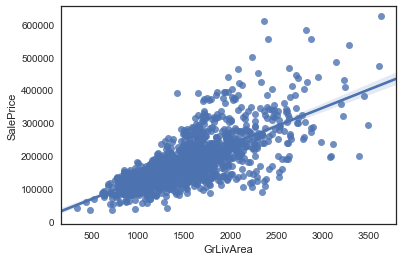

In [99]:
## Outliers from GrLivArea
train_df = train_df[train_df['GrLivArea'] < 4000] # from all_data df also?
sns.regplot(x='GrLivArea', y="SalePrice", data=train_df)

# Do something different for houses > 4k?


,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
88,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,IDOTRR,Feedr,Feedr,1Fam,1.5Fin,3,2,1915,1982,Hip,CompShg,Plywood,Plywood,None,0.0,Fa,Fa,CBlock,TA,Fa,No,Unf,0,Unf,0,1013,1013,GasA,TA,N,SBrkr,1013,0,513,1526,0,0,1,0,2,1,Fa,6,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,0,0,156,0,0,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000
250,30,RL,55.0,5350,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,BrkSide,Norm,Norm,1Fam,1Story,3,2,1940,1966,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,Po,CBlock,TA,TA,No,Unf,0,Unf,0,728,728,GasA,Ex,Y,SBrkr,1306,0,0,1306,0,0,1,0,3,1,Fa,6,Mod,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,263,0,0,0,0,0,NaN,GdWo,Shed,450,5,2010,WD,Normal,76500
378,20,RL,88.0,11394,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,StoneBr,Norm,Norm,1Fam,1Story,9,2,2010,2010,Hip,CompShg,VinylSd,VinylSd,Stone,350.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1445,Unf,0,411,1856,GasA,Ex,Y,SBrkr,1856,0,0,1856,1,0,1,1,1,1,Ex,8,Typ,1,Ex,Attchd,2010.0,Fin,3,834,TA,TA,Y,113,0,0,0,0,0,NaN,NaN,NaN,0,6,2010,New,Partial,394432
398,30,RM,60.0,8967,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,2,1920,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,Fa,BrkTil,Fa,Po,No,Unf,0,Unf,0,961,961,GasA,Gd,Y,Mix,1077,0,0,1077,0,0,1,0,2,1,TA,6,Maj2,0,NaN,Detchd,1920.0,Unf,1,338,Po,Po,N,0,0,0,0,0,0,NaN,NaN,NaN,0,11,2007,WD,Abnorml,67000
676,70,RM,60.0,9600,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,2,1900,1950,Gable,CompShg,AsbShng,Stucco,None,0.0,TA,TA,BrkTil,TA,Fa,No,Unf,0,Unf,0,1095,1095,GasW,Fa,N,SBrkr,1095,679,0,1774,1,0,2,0,4,2,TA,8,Min2,0,NaN,2Types,1920.0,Unf,3,779,Fa,Fa,N,0,0,90,0,0,0,NaN,NaN,NaN,0,5,2006,WD,Normal,87000


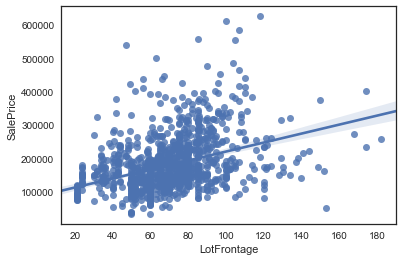

In [106]:
## Look at other possible outliers

## Go through scatterplots of numerical features
#cols = list(train_df.select_dtypes(['float64', 'int64']).columns)
#for i, col in enumerate(train_df[cols[:3]]): # when all of these cols used, killed the kernel
#    plt.figure(i)
#    sns.regplot(x=train_df[col], y="SalePrice", data=train_df)

# Quality Condition #2 w/ saleprice 400k
train_df.loc[train_df['OverallCond'] == 2] # seems like condition is wrong for this one, high price b/c high qual and new
# left in dataset

# LotFrontage/Area
sns.regplot(x='LotFrontage', y="SalePrice", data=train_df[train_df['LotFrontage'] < 250])
# left in dataset


In [ ]:
## To Do
# ?dummy, one-hot-encoding
# ?train/test, when alter all data then resplit?
# ?Standardize numerical features (on train separ)
# ?Log/skew, prob. plot
# Model such can easily turn on/off model parameteres
# explore the raw data, boxplots further (and on added features)
# bunch houses built recently- inc quality and price
# ?collinearity/feature selection
# read through and cite kernels again
# grlivarea vs. 1st floor sf?

## Nice To Have
# Add'l data?: interest rates, geocode, university?, crim rate, days on market, unemploy, foreclosure, census tract demog, income, employment, S&P

## Questions

# med: remove outliers?
# low: binaryize, 

Preprocessing:
Formatting, cleaning and sampling

Feature Engineering:
    Feature engineering is the process of transforming raw data into features that better represent the underlying problem to the predictive models, 
    resulting in improved model accuracy on unseen data.
Scaling (0-1), Standardize (gaussian distribution, StandardScaler)
Decomposition
Aggregation, Bucketize
binarizing: binary attributes in Python using scikit-learn with the Binarizer class.
Ref: https://machinelearningmastery.com/prepare-data-machine-learning-python-scikit-learn/
        
        
Possibly duplicate columns
# Check NA, None, '' - is NA = NaN??

## Misc
# train.loc[:, ('1stFlrSF', 'LowQualFinSF')]